# Data Cleaning

This logbook performs minor data cleaning on the raw census data.

The cleaned data is then reused in the design phase of this project.

# Imports / Global Variables

In [1]:
# Imports

import sys  
sys.path.insert(0, "../src")
from find_donors import *                     # Module containing donor_finder

# Print parameters

pd.set_option('expand_frame_repr', False)     # print(df) will show all DataFrame columns.
import plotly.io as pio                       # Need this so plotly images in a Jupyter notebook show up in GitHub.
pio.renderers.default="plotly_mimetype"       # "   "

# Global variables

CENSUS_FILE_RAW = "../data/census.csv"
CENSUS_FILE_CLEANED = "../data/census_cleaned.csv"

# Data Cleaning

In [2]:
# Load raw census data

df_raw = pd.read_csv(CENSUS_FILE_RAW)

display(df_raw)


,age,workclass,education_level,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,income
0,39,State-gov,Bachelors,13.0,Never-married,Adm-clerical,Not-in-family,White,Male,2174.0,0.0,40.0,United-States,<=50K
1,50,Self-emp-not-inc,Bachelors,13.0,Married-civ-spouse,Exec-managerial,Husband,White,Male,0.0,0.0,13.0,United-States,<=50K
2,38,Private,HS-grad,9.0,Divorced,Handlers-cleaners,Not-in-family,White,Male,0.0,0.0,40.0,United-States,<=50K
3,53,Private,11th,7.0,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0.0,0.0,40.0,United-States,<=50K
4,28,Private,Bachelors,13.0,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0.0,0.0,40.0,Cuba,<=50K
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45217,33,Private,Bachelors,13.0,Never-married,Prof-specialty,Own-child,White,Male,0.0,0.0,40.0,United-States,<=50K
45218,39,Private,Bachelors,13.0,Divorced,Prof-specialty,Not-in-family,White,Female,0.0,0.0,36.0,United-States,<=50K
45219,38,Private,Bachelors,13.0,Married-civ-spouse,Prof-specialty,Husband,White,Male,0.0,0.0,50.0,United-States,<=50K
45220,44,Private,Bachelors,13.0,Divorced,Adm-clerical,Own-child,Asian-Pac-Islander,Male,5455.0,0.0,40.0,United-States,<=50K


In [3]:
# Clean census data

df_cleaned = df_raw.copy()

# Make all text lowercase
df_cleaned = df_cleaned.applymap(lambda x: x.lower() if type(x) == str else x)

# Remove leading/trailing spaces
df_cleaned = df_cleaned.applymap(lambda x: x.strip() if type(x) == str else x)

# Turn underscores ( _ ) to dashes ( - )
# (column headers only)
headers_new = [header.replace("_", "-") for header in df_cleaned.columns]
df_cleaned.columns = headers_new

display(df_cleaned)

,age,workclass,education-level,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,income
0,39,state-gov,bachelors,13.0,never-married,adm-clerical,not-in-family,white,male,2174.0,0.0,40.0,united-states,<=50k
1,50,self-emp-not-inc,bachelors,13.0,married-civ-spouse,exec-managerial,husband,white,male,0.0,0.0,13.0,united-states,<=50k
2,38,private,hs-grad,9.0,divorced,handlers-cleaners,not-in-family,white,male,0.0,0.0,40.0,united-states,<=50k
3,53,private,11th,7.0,married-civ-spouse,handlers-cleaners,husband,black,male,0.0,0.0,40.0,united-states,<=50k
4,28,private,bachelors,13.0,married-civ-spouse,prof-specialty,wife,black,female,0.0,0.0,40.0,cuba,<=50k
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45217,33,private,bachelors,13.0,never-married,prof-specialty,own-child,white,male,0.0,0.0,40.0,united-states,<=50k
45218,39,private,bachelors,13.0,divorced,prof-specialty,not-in-family,white,female,0.0,0.0,36.0,united-states,<=50k
45219,38,private,bachelors,13.0,married-civ-spouse,prof-specialty,husband,white,male,0.0,0.0,50.0,united-states,<=50k
45220,44,private,bachelors,13.0,divorced,adm-clerical,own-child,asian-pac-islander,male,5455.0,0.0,40.0,united-states,<=50k



COLUMN NAME

age

UNIQUE VALUES


[17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40
 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64
 65 66 67 68 69 70 71 72 73 74 75 76 77 78 79 80 81 82 83 84 85 86 87 88
 89 90]

UNIQUE VALUES COUNT

17    493
18    695
19    864
20    916
21    935
     ... 
86      1
87      1
88      5
89      1
90     46
Name: age, Length: 74, dtype: int64

UNIQUE VALUES COUNT HISTOGRAM



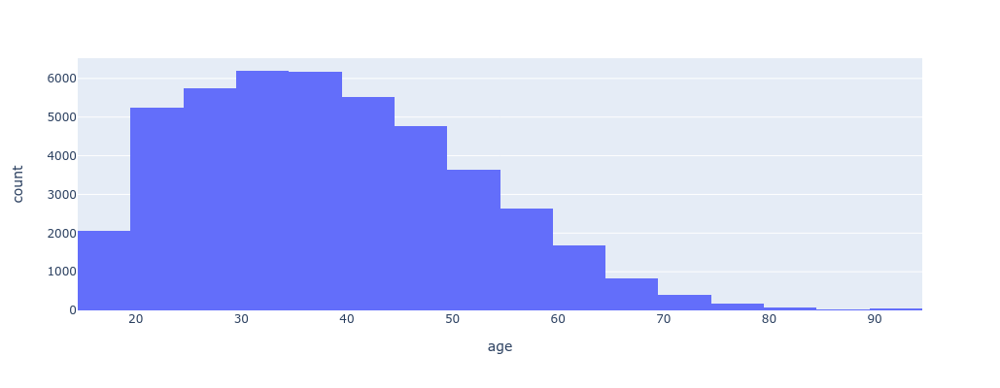


COLUMN NAME

workclass

UNIQUE VALUES


['federal-gov' 'local-gov' 'private' 'self-emp-inc' 'self-emp-not-inc'
 'state-gov' 'without-pay']

UNIQUE VALUES COUNT

federal-gov          1406
local-gov            3100
private             33307
self-emp-inc         1646
self-emp-not-inc     3796
state-gov            1946
without-pay            21
Name: workclass, dtype: int64

UNIQUE VALUES COUNT HISTOGRAM



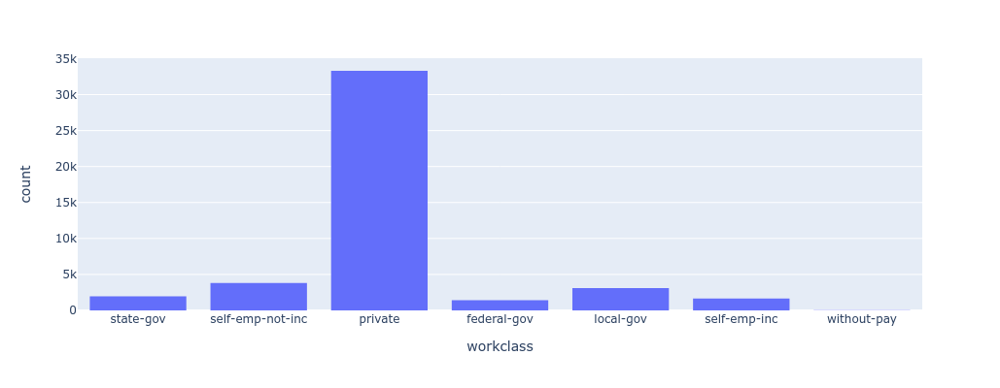


COLUMN NAME

education-level

UNIQUE VALUES


['10th' '11th' '12th' '1st-4th' '5th-6th' '7th-8th' '9th' 'assoc-acdm'
 'assoc-voc' 'bachelors' 'doctorate' 'hs-grad' 'masters' 'preschool'
 'prof-school' 'some-college']

UNIQUE VALUES COUNT

10th             1223
11th             1619
12th              577
1st-4th           222
5th-6th           449
7th-8th           823
9th               676
assoc-acdm       1507
assoc-voc        1959
bachelors        7570
doctorate         544
hs-grad         14783
masters          2514
preschool          72
prof-school       785
some-college     9899
Name: education-level, dtype: int64

UNIQUE VALUES COUNT HISTOGRAM



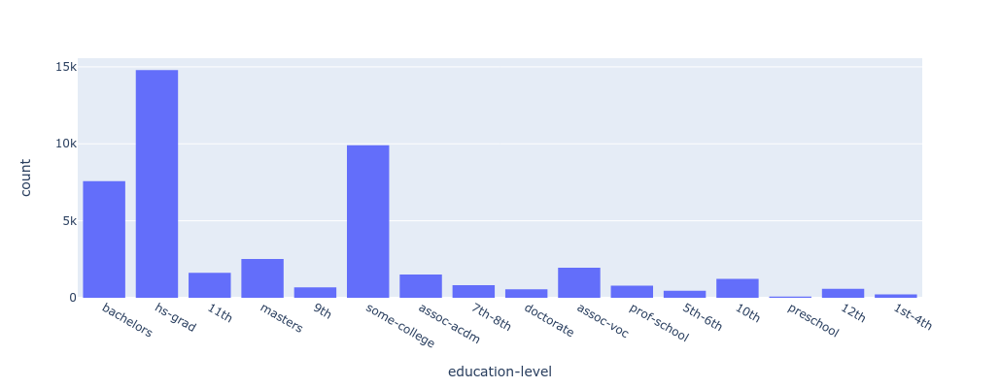


COLUMN NAME

education-num

UNIQUE VALUES


[ 1.  2.  3.  4.  5.  6.  7.  8.  9. 10. 11. 12. 13. 14. 15. 16.]

UNIQUE VALUES COUNT

1.0        72
2.0       222
3.0       449
4.0       823
5.0       676
6.0      1223
7.0      1619
8.0       577
9.0     14783
10.0     9899
11.0     1959
12.0     1507
13.0     7570
14.0     2514
15.0      785
16.0      544
Name: education-num, dtype: int64

UNIQUE VALUES COUNT HISTOGRAM



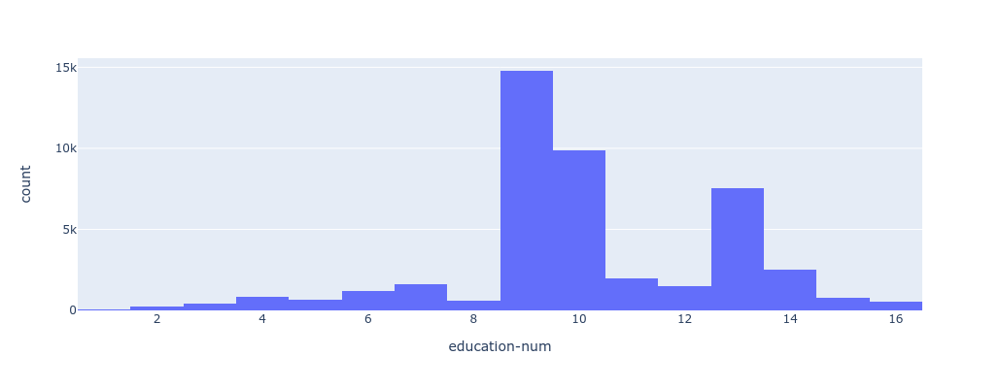


COLUMN NAME

marital-status

UNIQUE VALUES


['divorced' 'married-af-spouse' 'married-civ-spouse'
 'married-spouse-absent' 'never-married' 'separated' 'widowed']

UNIQUE VALUES COUNT

divorced                  6297
married-af-spouse           32
married-civ-spouse       21055
married-spouse-absent      552
never-married            14598
separated                 1411
widowed                   1277
Name: marital-status, dtype: int64

UNIQUE VALUES COUNT HISTOGRAM



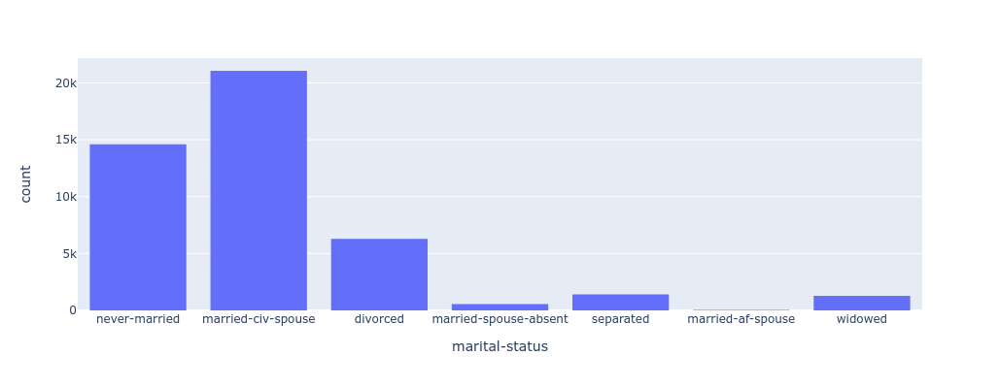


COLUMN NAME

occupation

UNIQUE VALUES


['adm-clerical' 'armed-forces' 'craft-repair' 'exec-managerial'
 'farming-fishing' 'handlers-cleaners' 'machine-op-inspct' 'other-service'
 'priv-house-serv' 'prof-specialty' 'protective-serv' 'sales'
 'tech-support' 'transport-moving']

UNIQUE VALUES COUNT

adm-clerical         5540
armed-forces           14
craft-repair         6020
exec-managerial      5984
farming-fishing      1480
handlers-cleaners    2046
machine-op-inspct    2970
other-service        4808
priv-house-serv       232
prof-specialty       6008
protective-serv       976
sales                5408
tech-support         1420
transport-moving     2316
Name: occupation, dtype: int64

UNIQUE VALUES COUNT HISTOGRAM



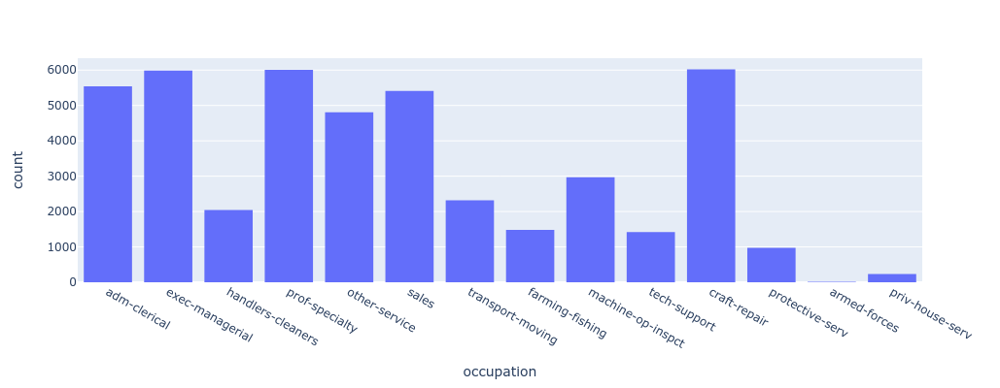


COLUMN NAME

relationship

UNIQUE VALUES


['husband' 'not-in-family' 'other-relative' 'own-child' 'unmarried' 'wife']

UNIQUE VALUES COUNT

husband           18666
not-in-family     11702
other-relative     1349
own-child          6626
unmarried          4788
wife               2091
Name: relationship, dtype: int64

UNIQUE VALUES COUNT HISTOGRAM



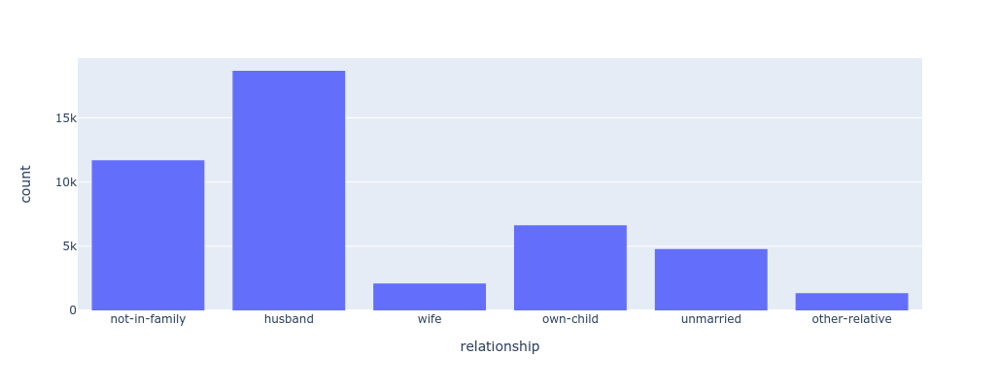


COLUMN NAME

race

UNIQUE VALUES


['amer-indian-eskimo' 'asian-pac-islander' 'black' 'other' 'white']

UNIQUE VALUES COUNT

amer-indian-eskimo      435
asian-pac-islander     1303
black                  4228
other                   353
white                 38903
Name: race, dtype: int64

UNIQUE VALUES COUNT HISTOGRAM



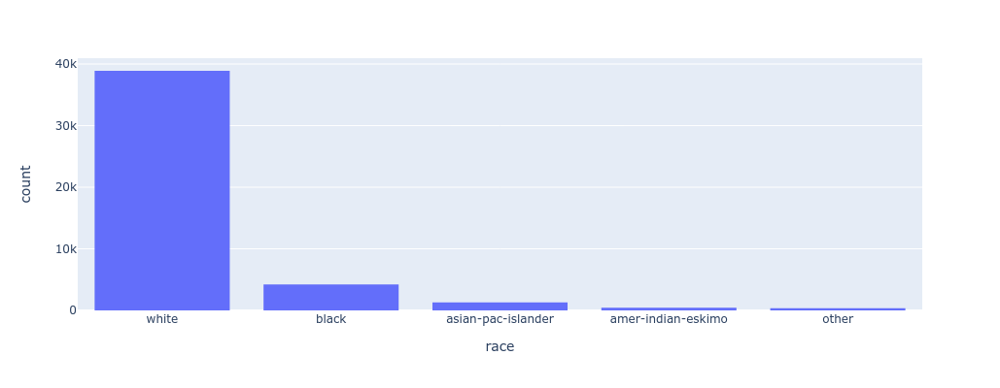


COLUMN NAME

sex

UNIQUE VALUES


['female' 'male']

UNIQUE VALUES COUNT

female    14695
male      30527
Name: sex, dtype: int64

UNIQUE VALUES COUNT HISTOGRAM



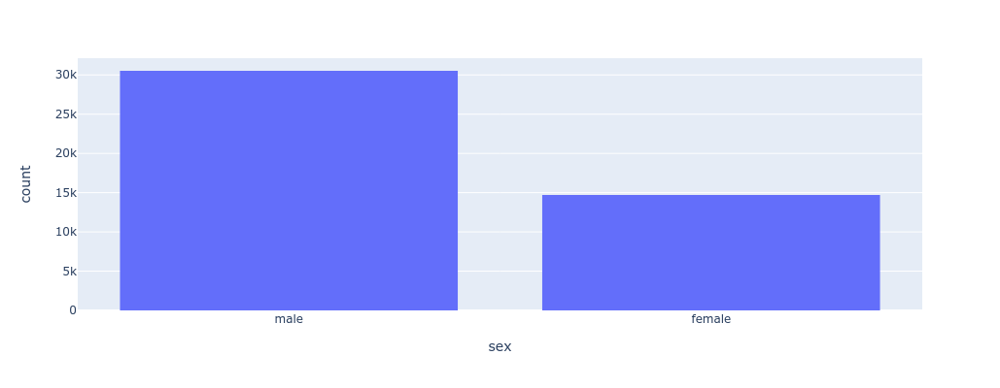


COLUMN NAME

capital-gain

UNIQUE VALUES


[    0.   114.   401.   594.   914.   991.  1055.  1086.  1151.  1173.
  1264.  1409.  1424.  1455.  1471.  1506.  1639.  1731.  1797.  1831.
  1848.  2009.  2036.  2050.  2062.  2105.  2174.  2176.  2202.  2228.
  2290.  2329.  2346.  2354.  2387.  2407.  2414.  2463.  2538.  2580.
  2597.  2635.  2653.  2829.  2885.  2907.  2936.  2961.  2964.  2977.
  2993.  3103.  3137.  3273.  3325.  3411.  3418.  3432.  3456.  3464.
  3471.  3674.  3781.  3818.  3887.  3908.  3942.  4064.  4101.  4386.
  4416.  4508.  4650.  4687.  4787.  4865.  4931.  4934.  5013.  5060.
  5178.  5455.  5556.  5721.  6097.  6360.  6418.  6497.  6514.  6723.
  6767.  6849.  7262.  7298.  7430.  7443.  7688.  7896.  7978.  8614.
  9386.  9562. 10520. 10566. 10605. 11678. 13550. 14084. 14344. 15020.
 15024. 15831. 18481. 20051. 22040. 25124. 25236. 27828. 34095. 41310.
 99999.]

UNIQUE VALUES COUNT

0.0        41432
114.0          8
401.0          2
594.0         42
914.0

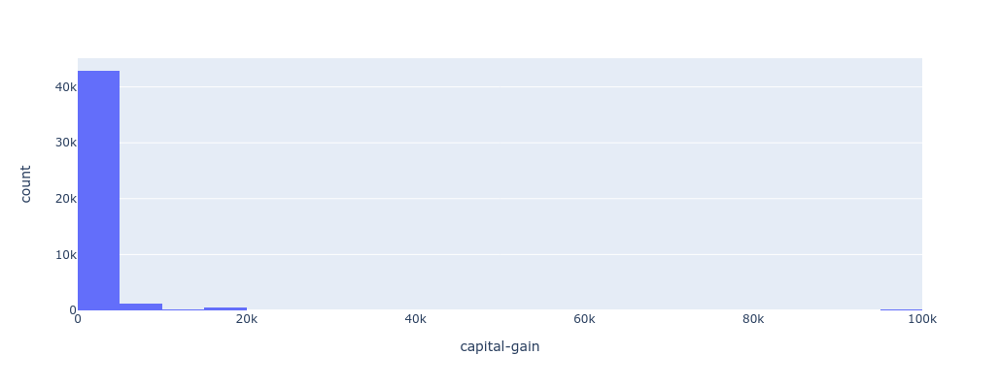


COLUMN NAME

capital-loss

UNIQUE VALUES


[   0.  155.  213.  323.  419.  625.  653.  810.  880.  974. 1092. 1138.
 1258. 1340. 1380. 1408. 1411. 1421. 1429. 1485. 1504. 1510. 1539. 1564.
 1573. 1579. 1590. 1594. 1602. 1617. 1628. 1648. 1651. 1668. 1669. 1672.
 1719. 1721. 1726. 1735. 1740. 1741. 1755. 1762. 1816. 1825. 1844. 1848.
 1870. 1876. 1887. 1902. 1911. 1944. 1974. 1977. 1980. 2001. 2002. 2042.
 2051. 2057. 2080. 2129. 2149. 2163. 2174. 2179. 2201. 2205. 2206. 2231.
 2238. 2246. 2258. 2267. 2282. 2339. 2352. 2377. 2392. 2415. 2444. 2457.
 2467. 2472. 2547. 2559. 2603. 2754. 2824. 3004. 3175. 3683. 3770. 3900.
 4356.]

UNIQUE VALUES COUNT

0.0       43082
155.0         1
213.0         5
323.0         5
419.0         1
          ...  
3175.0        2
3683.0        2
3770.0        4
3900.0        2
4356.0        1
Name: capital-loss, Length: 97, dtype: int64

UNIQUE VALUES COUNT HISTOGRAM



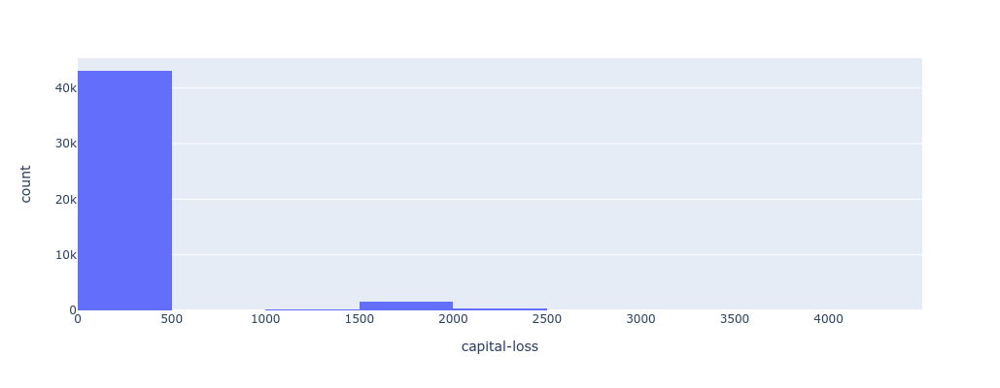


COLUMN NAME

hours-per-week

UNIQUE VALUES


[ 1.  2.  3.  4.  5.  6.  7.  8.  9. 10. 11. 12. 13. 14. 15. 16. 17. 18.
 19. 20. 21. 22. 23. 24. 25. 26. 27. 28. 29. 30. 31. 32. 33. 34. 35. 36.
 37. 38. 39. 40. 41. 42. 43. 44. 45. 46. 47. 48. 49. 50. 51. 52. 53. 54.
 55. 56. 57. 58. 59. 60. 61. 62. 63. 64. 65. 66. 67. 68. 69. 70. 72. 73.
 74. 75. 76. 77. 78. 79. 80. 81. 82. 84. 85. 86. 87. 88. 89. 90. 91. 92.
 94. 95. 96. 97. 98. 99.]

UNIQUE VALUES COUNT

1.0      12
2.0      24
3.0      35
4.0      47
5.0      60
       ... 
95.0      2
96.0      9
97.0      2
98.0     14
99.0    123
Name: hours-per-week, Length: 96, dtype: int64

UNIQUE VALUES COUNT HISTOGRAM



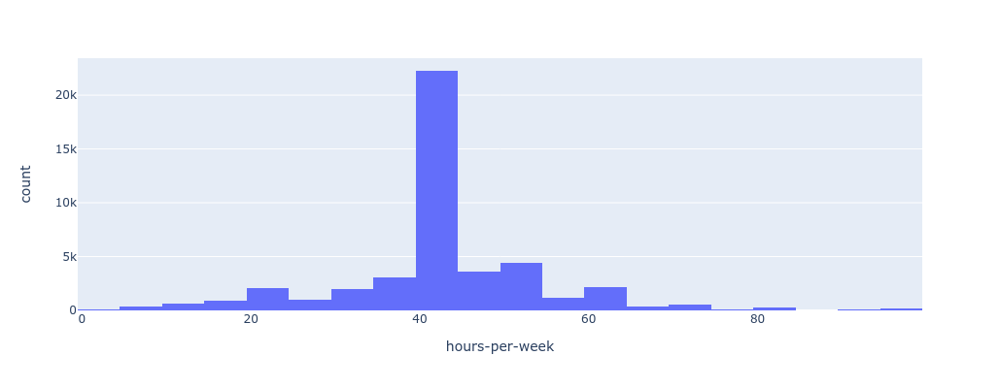


COLUMN NAME

native-country

UNIQUE VALUES


['cambodia' 'canada' 'china' 'columbia' 'cuba' 'dominican-republic'
 'ecuador' 'el-salvador' 'england' 'france' 'germany' 'greece' 'guatemala'
 'haiti' 'holand-netherlands' 'honduras' 'hong' 'hungary' 'india' 'iran'
 'ireland' 'italy' 'jamaica' 'japan' 'laos' 'mexico' 'nicaragua'
 'outlying-us(guam-usvi-etc)' 'peru' 'philippines' 'poland' 'portugal'
 'puerto-rico' 'scotland' 'south' 'taiwan' 'thailand' 'trinadad&tobago'
 'united-states' 'vietnam' 'yugoslavia']

UNIQUE VALUES COUNT

cambodia                         26
canada                          163
china                           113
columbia                         82
cuba                            133
dominican-republic               97
ecuador                          43
el-salvador                     147
england                         119
france                           36
germany                         193
greece                           49
guatemala                        86

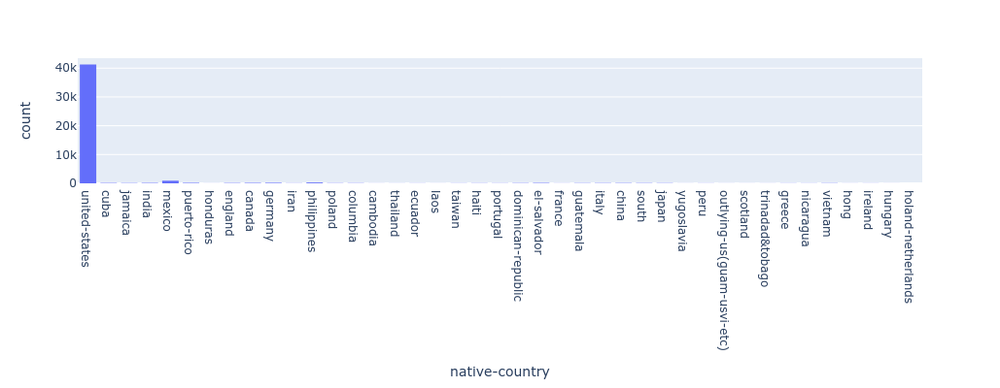


COLUMN NAME

income

UNIQUE VALUES


['<=50k' '>50k']

UNIQUE VALUES COUNT

<=50k    34014
>50k     11208
Name: income, dtype: int64

UNIQUE VALUES COUNT HISTOGRAM



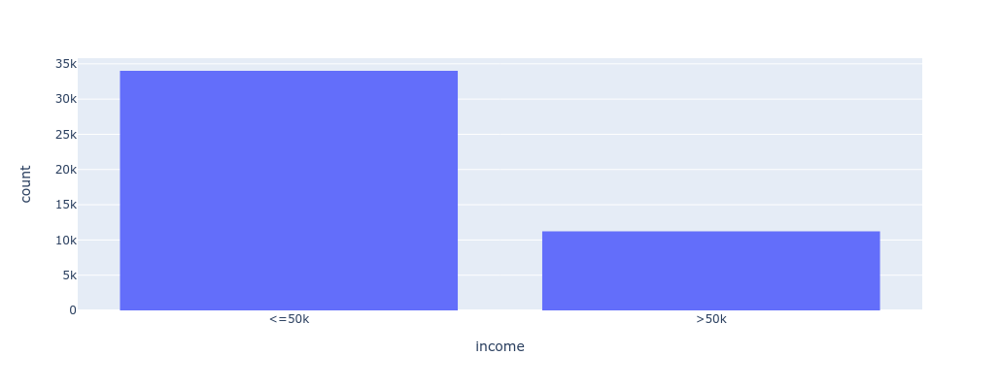

In [4]:
# Sanity check
# Print unique values of each column

print_df_unique_values(df_cleaned, 20)   
 

In [5]:
# Save cleaned data to file

df_cleaned.to_csv(CENSUS_FILE_CLEANED, index=False)
